# Importing needed libraries:

In [3]:
import numpy as np 
import pandas as pd 
import cv2
from PIL import Image
from skimage import exposure
import matplotlib.pyplot as plt


> ### Q1-partA

In [4]:
image1 = cv2.imread('/kaggle/input/hw1-cv/Image1.jpeg')

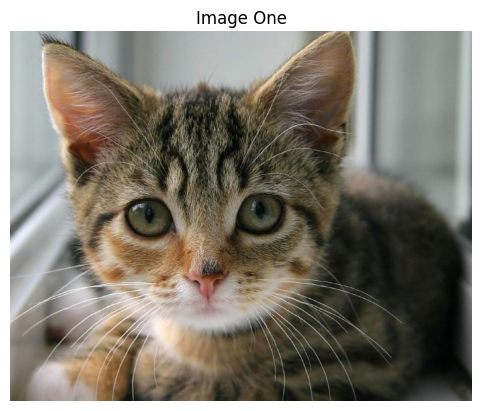

In [5]:
plt.imshow(cv2.cvtColor(image1, cv2.COLOR_BGR2RGB))
plt.title('Image One')
plt.axis('off')
plt.show()

> ### Q1-partB

In [6]:
image1_rgb = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)

In [7]:
rChannel, gChannel, bChannel = cv2.split(image1_rgb)

#### Display red channel

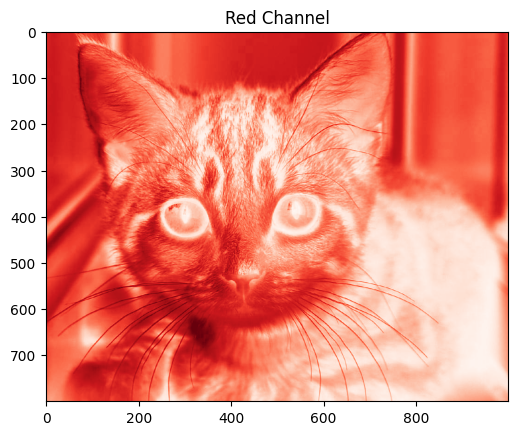

In [8]:
plt.imshow(rChannel, cmap='Reds')
plt.title('Red Channel')
plt.show()

#### Display green channel

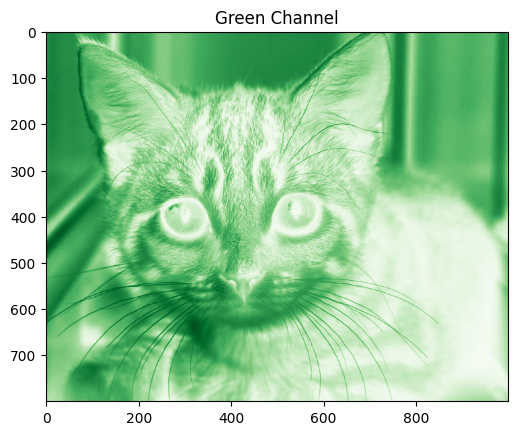

In [9]:
plt.imshow(gChannel, cmap='Greens')
plt.title('Green Channel')
plt.show()

#### Display blue channel

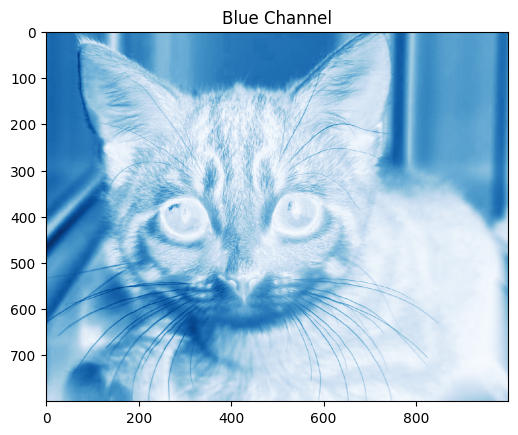

In [10]:
plt.imshow(bChannel, cmap='Blues')
plt.title('Blue Channel')

plt.show()

> ### Q1-partC

In [11]:
image = Image.open('/kaggle/input/hw1-cv/Image1.jpeg')

In convert_to_grayscale function we convert a color image to grayscale by iterating over each pixel of the image. For each pixel, first we calculates the luminance value using the formula Y = 0.299 * R + 0.587 * G + 0.114 * B, where R, G, and B represent the red, green, and blue channels of the pixel that we calculate. Then the luminance value is assigned to the corresponding pixel in the grayscale image.

In [12]:
def convert_to_grayscale(image):
    width, height = image.size
    gray_image = Image.new('L', (width, height))
    for y in range(height):
        for x in range(width):
            r, g, b = image.getpixel((x, y))
            luminance = int(0.299 * r + 0.587 * g + 0.114 * b)
            gray_image.putpixel((x, y), luminance)
    return gray_image


In binarize_image function we binarize a grayscale image by applying thresholding which is commonly 127. It sets pixel values above 127 to the maximum value (255, white) and pixel values below it to the minimum value (0, black). This process makes the image a binary image where each pixel is either black or white based on its intensity relative to the threshold value.

In [13]:
def binarize_image(gray_image, threshold=127):
    width, height = gray_image.size
    binary_image = Image.new('L', (width, height))
    for y in range(height):
        for x in range(width):
            luminance = gray_image.getpixel((x, y))
            if luminance > threshold:
                binary_image.putpixel((x, y), 255)
            else:
                binary_image.putpixel((x, y), 0)  
    return binary_image

In [14]:
gray_image = convert_to_grayscale(image)

binary_image = binarize_image(gray_image)

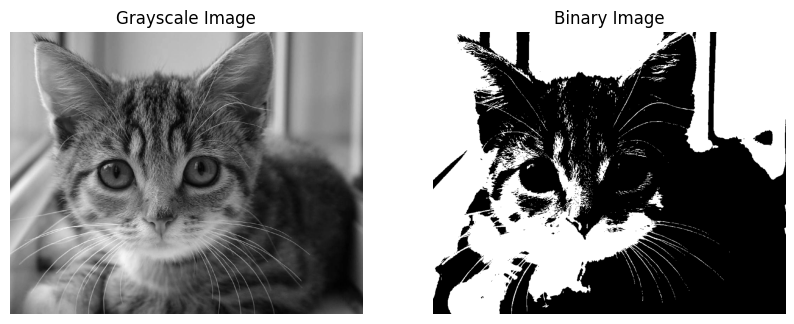

In [15]:
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(gray_image, cmap='gray')
plt.title('Grayscale Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(binary_image, cmap='gray')
plt.title('Binary Image')
plt.axis('off')

plt.show()

> ### Q1-partD

In [16]:
image1 = cv2.imread('/kaggle/input/hw1-cv/Image1.jpeg')

In [17]:
def convert_to_hsv(image):
    height, width, channels = image.shape
    hsv_image = np.zeros_like(image, dtype=np.uint8)

    for i in range(height):
        for j in range(width):
            b, g, r = image[i, j]
            b = b / 255.0
            g = g / 255.0
            r = r / 255.0

            cmax = max(b, g, r)
            cmin = min(b, g, r)
            delta = cmax - cmin

            # Hue calculation
            if delta == 0:
                h = 0
            elif cmax == r:
                h = 60 * (((g - b) / delta) % 6)
            elif cmax == g:
                h = 60 * (((b - r) / delta) + 2)
            else:
                h = 60 * (((r - g) / delta) + 4)

            # Saturation calculation
            if cmax == 0:
                s = 0
            else:
                s = delta / cmax

            # Value calculation
            v = cmax

            if h < 0:
                h += 360

            h = int((h / 360) * 255)
            s = int(s * 255)
            v = int(v * 255)

            hsv_image[i, j] = [h, s, v]

    return hsv_image



In [18]:
hsv_image_manual = convert_to_hsv(image1)

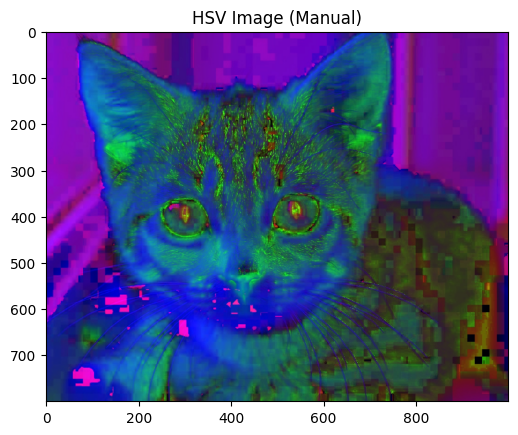

In [19]:
cv2.imwrite('hsv_image_manual.jpg', hsv_image_manual)

hsv_image_manual = cv2.imread('hsv_image_manual.jpg')

plt.imshow(hsv_image_manual)
plt.title('HSV Image (Manual)')  
plt.show()

> ### Q1-partE

In [20]:
hsv_image = cv2.cvtColor(image1, cv2.COLOR_BGR2HSV)

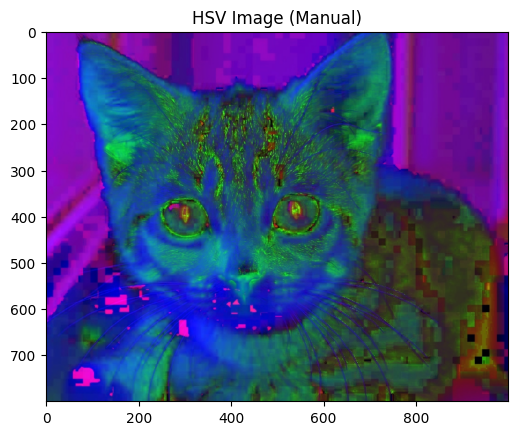

In [21]:
cv2.imwrite('hsv_image_manual.jpg', hsv_image_manual)

hsv_image_manual = cv2.imread('hsv_image_manual.jpg')

plt.imshow(hsv_image_manual)
plt.title('HSV Image (Manual)')  
plt.show()

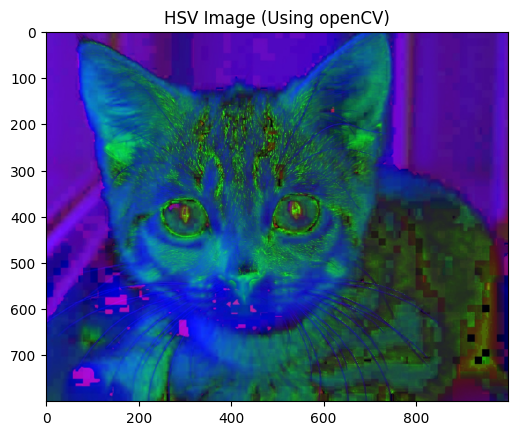

In [22]:
cv2.imwrite('hsv_image_using_openCV.jpg', hsv_image)

hsv_image_using_openCV = cv2.imread('hsv_image_using_openCV.jpg')

plt.imshow(hsv_image_using_openCV)
plt.title('HSV Image (Using openCV)')  
plt.show()

To visualize the pixels that are different between the two images with threshold 10 and calculate the percentage of difference we calculate the absolute difference between the two images.
Then we threshold the absolute difference image to identify pixels with differences above a certain threshold. Finally we visualize the thresholded difference image and calculate the percentage of different pixels compared to the total number of pixels.

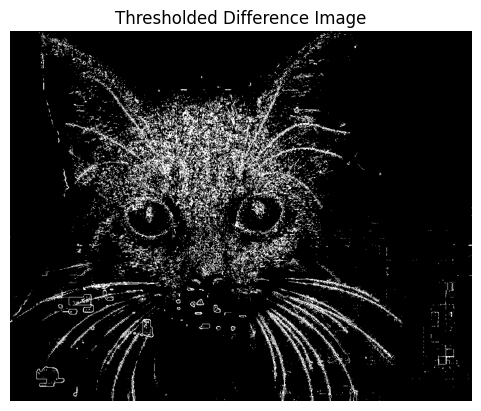

Percentage of different pixels: 8.68%


In [23]:
abs_diff = cv2.absdiff(hsv_image_manual, hsv_image)

abs_diff_gray = cv2.cvtColor(abs_diff, cv2.COLOR_BGR2GRAY)

threshold = 10
_, diff_mask = cv2.threshold(abs_diff_gray, threshold, 255, cv2.THRESH_BINARY)

total_pixels = np.prod(hsv_image_manual.shape[:2])
num_diff_pixels = np.count_nonzero(diff_mask)
percent_diff = (num_diff_pixels / total_pixels) * 100

plt.imshow(diff_mask, cmap='gray')
plt.title('Thresholded Difference Image')
plt.axis('off')
plt.show()

print(f'Percentage of different pixels: {percent_diff:.2f}%')

This difference would because the hsv_image_manual image is generated manually, which means that the HSV values may have been calculated differently compared to the hsv_image_using_openCV image generated using OpenCV's built-in function. Small variations in the manual calculation process or parameters can lead to differences in the resulting images.

> ### Q1-partF

we extract red regions by first converting RGB image to the HSV (Hue, Saturation, Value). The HSV color space is more suitable for this task because it separates the color information from the brightness information.So first we use cv2.cvtColor() function for that. Then we define the range for red color in HSV. Red color in HSV spans a range of hues because it wraps around the color wheel. We define a range of hues that correspond to red. This range is hues close to both 0 and 180. Additionally, we set ranges for saturation and value to ensure that we capture only vivid red colors. Next we create a binary mask that white pixels represent the regions in the image that fall within the specified range of hues, saturation, and value for red color. We use the cv2.inRange() function to create this mask. Finally we use bitwise AND operation (cv2.bitwise_and()) to apply the mask to the original image. This operation retains only those pixels in the original image where the corresponding pixel in the mask is white, effectively highlighting regions in the image that contain the color red.

In [24]:
image = cv2.imread('/kaggle/input/hw1-cv/Image1.jpeg')

hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

In [25]:
lower_red = np.array([0, 70, 50])
upper_red = np.array([12, 255, 255])

mask = cv2.inRange(hsv_image, lower_red, upper_red)

red_regions = cv2.bitwise_and(image, image, mask=mask)

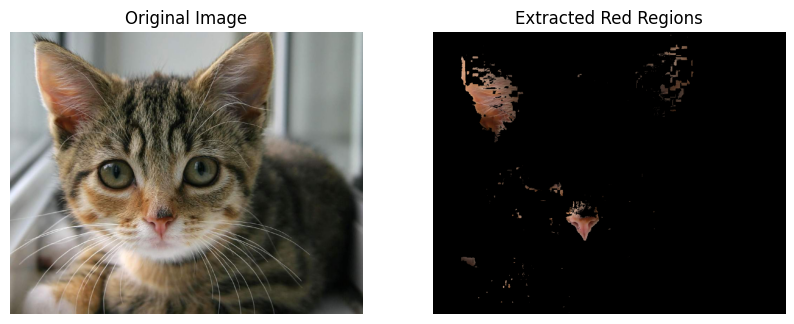

In [26]:
cv2.imwrite('original_image.jpg', image)
cv2.imwrite('extracted_red_regions.jpg', red_regions)

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(red_regions, cv2.COLOR_BGR2RGB))
plt.title('Extracted Red Regions')
plt.axis('off')

plt.show()

> ### Q2

In [27]:
image1 = cv2.imread('/kaggle/input/hw1-cv/Image2.1.jpg')
image2 = cv2.imread('/kaggle/input/hw1-cv/Image2.2.jpg')

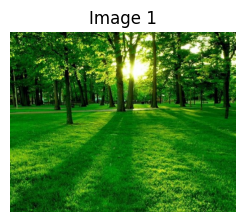

In [28]:
image1_rgb = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
plt.subplot(1, 2, 1)
plt.imshow(image1_rgb)
plt.title('Image 1')
plt.axis('off')
plt.show()

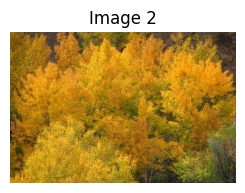

In [29]:

image2_rgb = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)
plt.subplot(1, 2, 2)
plt.imshow(image2_rgb)
plt.title('Image 2')
plt.axis('off')
plt.show()


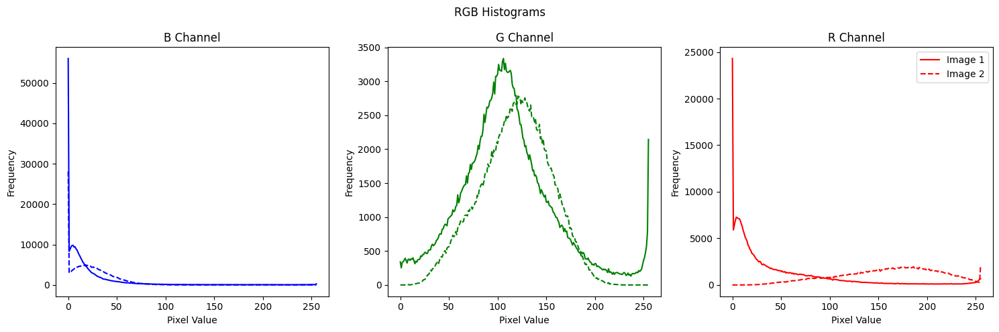

In [30]:
colors = ('b', 'g', 'r')
plt.figure(figsize=(15, 5))

for i, col in enumerate(colors):
    plt.subplot(1, 3, i+1) 
    plt.title(col.upper() + ' Channel')  
    
    if len(image1.shape) == 3 and image1.shape[2] >= i+1:
        hist1 = cv2.calcHist([image1], [i], None, [256], [0, 256]) 
        plt.plot(hist1, color=col, label='Image 1') 
    
    if len(image2.shape) == 3 and image2.shape[2] >= i+1:
        hist2 = cv2.calcHist([image2], [i], None, [256], [0, 256])
        plt.plot(hist2, color=col, linestyle='dashed', label='Image 2')  
    
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')

plt.suptitle('RGB Histograms')  
plt.tight_layout()
plt.legend()
plt.show()


In [31]:
image1 = cv2.imread('/kaggle/input/hw1-cv/Image2.1.jpg')
image2 = cv2.imread('/kaggle/input/hw1-cv/Image2.2.jpg')

In [32]:
image1_rgb = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
image2_rgb = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

In [33]:
hist1_r = cv2.calcHist([image1_rgb], [0], None, [256], [0, 256])
hist1_g = cv2.calcHist([image1_rgb], [1], None, [256], [0, 256])
hist1_b = cv2.calcHist([image1_rgb], [2], None, [256], [0, 256])

hist2_r = cv2.calcHist([image2_rgb], [0], None, [256], [0, 256])
hist2_g = cv2.calcHist([image2_rgb], [1], None, [256], [0, 256])
hist2_b = cv2.calcHist([image2_rgb], [2], None, [256], [0, 256])

# Normalize histograms
hist1_r_norm = hist1_r / np.sum(hist1_r)
hist1_g_norm = hist1_g / np.sum(hist1_g)
hist1_b_norm = hist1_b / np.sum(hist1_b)

hist2_r_norm = hist2_r / np.sum(hist2_r)
hist2_g_norm = hist2_g / np.sum(hist2_g)
hist2_b_norm = hist2_b / np.sum(hist2_b)

# Compute cumulative distribution functions (CDFs) for each channel
cdf1_r = np.cumsum(hist1_r_norm)
cdf1_g = np.cumsum(hist1_g_norm)
cdf1_b = np.cumsum(hist1_b_norm)

cdf2_r = np.cumsum(hist2_r_norm)
cdf2_g = np.cumsum(hist2_g_norm)
cdf2_b = np.cumsum(hist2_b_norm)

# Map intensities for each channel separately
mapping_r = np.interp(cdf1_r, cdf2_r, range(256)).astype(np.uint8)
mapping_g = np.interp(cdf1_g, cdf2_g, range(256)).astype(np.uint8)
mapping_b = np.interp(cdf1_b, cdf2_b, range(256)).astype(np.uint8)

# Apply mapping to each channel of the source image
matched_image_r = mapping_r[image1_rgb[:, :, 0]]
matched_image_g = mapping_g[image1_rgb[:, :, 1]]
matched_image_b = mapping_b[image1_rgb[:, :, 2]]

# Combine matched channels into a single image
matched_image_rgb = np.stack((matched_image_r, matched_image_g, matched_image_b), axis=-1)

# Calculate histograms for each channel in the matched image
hist_matched_r = cv2.calcHist([matched_image_rgb], [0], None, [256], [0, 256])
hist_matched_g = cv2.calcHist([matched_image_rgb], [1], None, [256], [0, 256])
hist_matched_b = cv2.calcHist([matched_image_rgb], [2], None, [256], [0, 256])

# Normalize histograms
hist_matched_r_norm = hist_matched_r / np.sum(hist_matched_r)
hist_matched_g_norm = hist_matched_g / np.sum(hist_matched_g)
hist_matched_b_norm = hist_matched_b / np.sum(hist_matched_b)

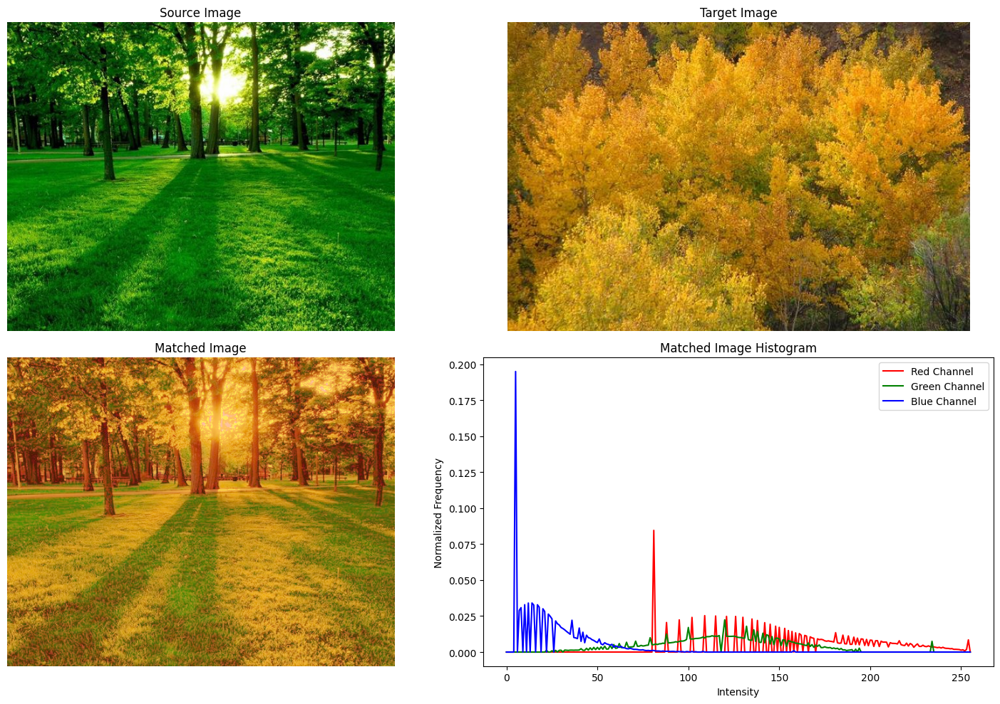

In [34]:
plt.figure(figsize=(15, 10))

plt.subplot(2, 2, 1)
plt.imshow(image1_rgb)
plt.title('Source Image')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(image2_rgb)
plt.title('Target Image')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(matched_image_rgb)
plt.title('Matched Image')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.plot(hist_matched_r_norm, color='r', label='Red Channel')
plt.plot(hist_matched_g_norm, color='g', label='Green Channel')
plt.plot(hist_matched_b_norm, color='b', label='Blue Channel')
plt.title('Matched Image Histogram')
plt.xlabel('Intensity')
plt.ylabel('Normalized Frequency')
plt.legend()

plt.tight_layout()
plt.show()

> ### Q3-partA

In [35]:
image = cv2.imread('/kaggle/input/hw1-cv/Image3.jpg')
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

Text(0.5, 1.0, 'Original Image')

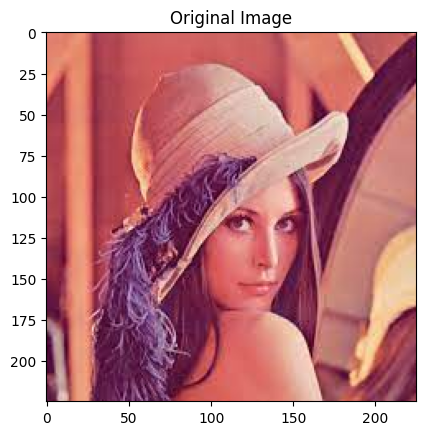

In [36]:
plt.imshow(image_rgb)
plt.title('Original Image')

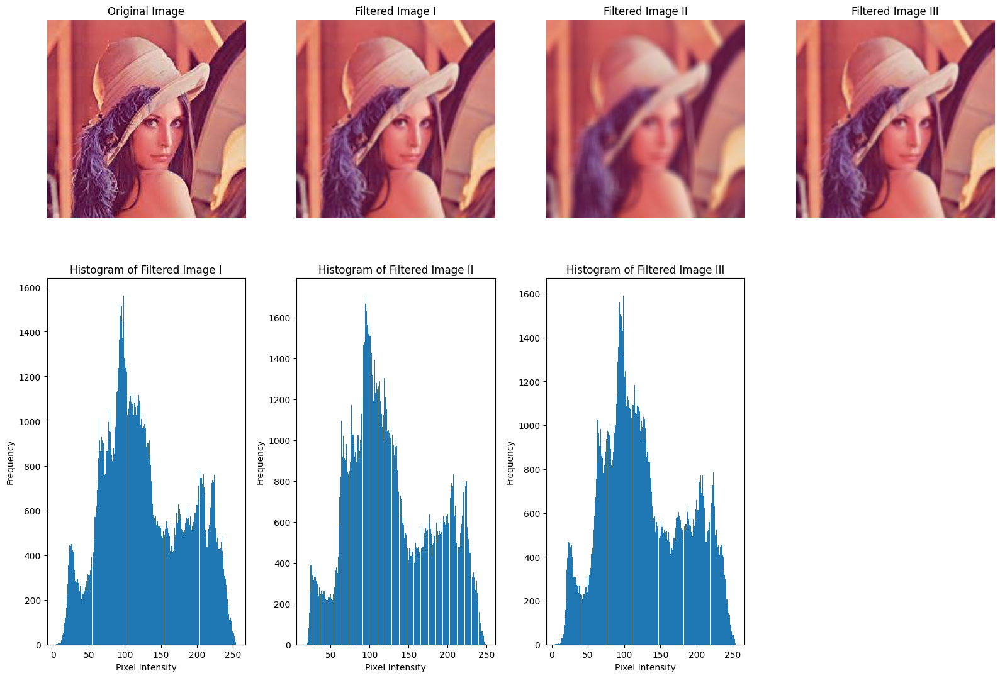

In [37]:
filtered_I = cv2.blur(image_rgb, (3, 3))
filtered_I_twice = cv2.blur(filtered_I, (3, 3))

filtered_II = cv2.blur(image_rgb, (9, 9))

filtered_III = cv2.GaussianBlur(image_rgb, (5, 5), 0)

plt.figure(figsize=(16, 12))

plt.subplot(2, 4, 1)
plt.imshow(image_rgb)
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 4, 2)
plt.imshow(filtered_I, cmap='gray')
plt.title('Filtered Image I')
plt.axis('off')

plt.subplot(2, 4, 3)
plt.imshow(filtered_II, cmap='gray')
plt.title('Filtered Image II')
plt.axis('off')

plt.subplot(2, 4, 4)
plt.imshow(filtered_III, cmap='gray')
plt.title('Filtered Image III')
plt.axis('off')

plt.subplot(2, 4, 5)
plt.hist(filtered_I.ravel(), bins=256)
plt.title('Histogram of Filtered Image I')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')

plt.subplot(2, 4, 6)
plt.hist(filtered_II.ravel(), bins=256)
plt.title('Histogram of Filtered Image II')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')

plt.subplot(2, 4, 7)
plt.hist(filtered_III.ravel(), bins=256)
plt.title('Histogram of Filtered Image III')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

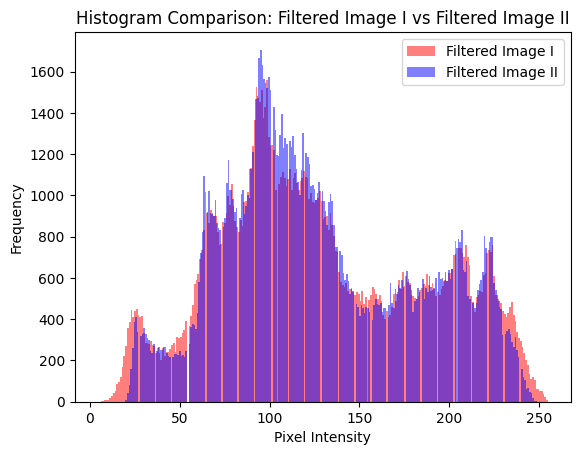

In [38]:
plt.hist(filtered_I.ravel(), bins=256, color='r', alpha=0.5, label='Filtered Image I')
plt.hist(filtered_II.ravel(), bins=256, color='b', alpha=0.5, label='Filtered Image II')
plt.title('Histogram Comparison: Filtered Image I vs Filtered Image II')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.legend()

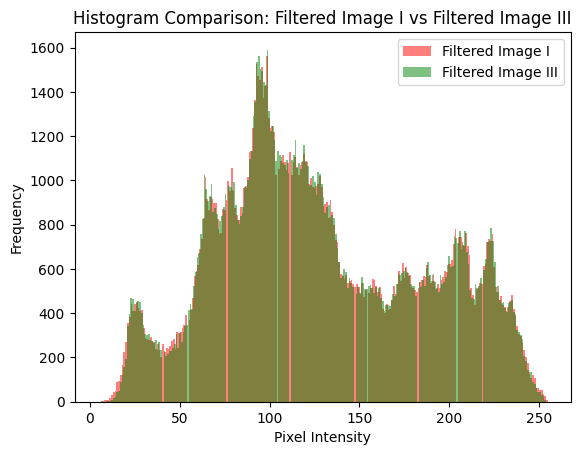

In [39]:
# Histogram for Filtered Image I and III
plt.hist(filtered_I.ravel(), bins=256, color='r', alpha=0.5, label='Filtered Image I')
plt.hist(filtered_III.ravel(), bins=256, color='g', alpha=0.5, label='Filtered Image III')
plt.title('Histogram Comparison: Filtered Image I vs Filtered Image III')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.legend()


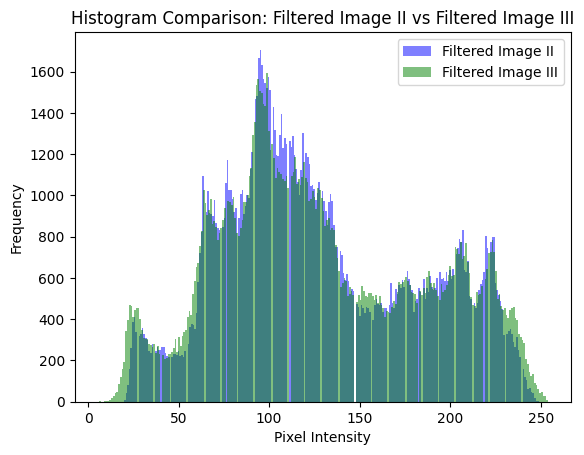

In [40]:
# Histogram for Filtered Image II and III
plt.hist(filtered_II.ravel(), bins=256, color='b', alpha=0.5, label='Filtered Image II')
plt.hist(filtered_III.ravel(), bins=256, color='g', alpha=0.5, label='Filtered Image III')
plt.title('Histogram Comparison: Filtered Image II vs Filtered Image III')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.legend()

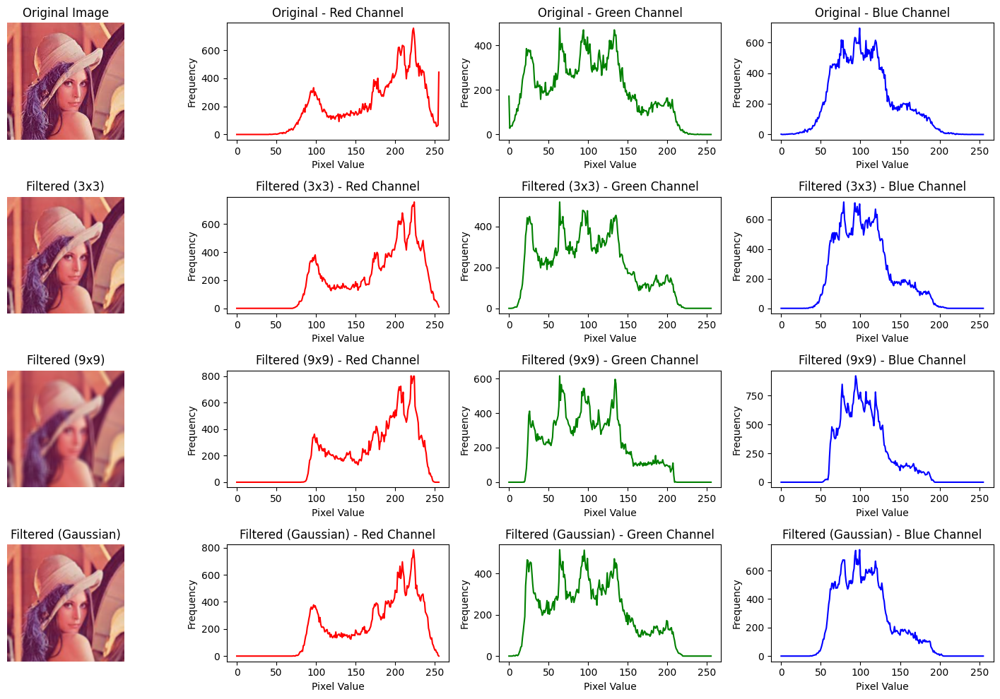

In [41]:
filters = [
    ('Filtered (3x3)', cv2.blur, (3, 3)),
    ('Filtered (9x9)', cv2.blur, (9, 9)),
    ('Filtered (Gaussian)', cv2.GaussianBlur, (5, 5), 0)
]

plt.figure(figsize=(15, 10))
plt.subplot(4, 4, 1)
plt.imshow(image_rgb)
plt.title('Original Image')
plt.axis('off')

for i, color in enumerate(['Red', 'Green', 'Blue']):
    hist = cv2.calcHist([image_rgb], [i], None, [256], [0, 256])
    plt.subplot(4, 4, i+2)
    plt.plot(hist, color=color)
    plt.title(f'Original - {color} Channel')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')


for j, (filter_name, filter_func, *args) in enumerate(filters, start=1):

    filtered_image = filter_func(image_rgb, *args)
    plt.subplot(4, 4, j*4 + 1)
    plt.imshow(filtered_image)
    plt.title(filter_name)
    plt.axis('off')
    
    for i, color in enumerate(['Red', 'Green', 'Blue']):
        hist = cv2.calcHist([filtered_image], [i], None, [256], [0, 256])
        plt.subplot(4, 4, j*4 + 2 + i)
        plt.plot(hist, color=color)
        plt.title(f'{filter_name} - {color} Channel')
        plt.xlabel('Pixel Value')
        plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

**none of these results is similar to the original image**

> ### Q3-partB

To find an equivalent filter to replace with two 3x3 averaging filters, we can determine a single filter that provides a similar effect. One approach is to find the convolution kernel that replicates the effect of applying two 3x3 averaging filters consecutively.

The effect of applying two 3x3 averaging filters is equivalent to convolving the image with the kernel obtained by convolving the individual kernels of the two filters. Since averaging filters involve summing up neighboring pixel values, we can compute the resulting kernel by convolving the two 3x3 kernels.

In [42]:
kernel_3x3 = np.ones((3, 3), dtype=np.float32) / 9.0

equivalent_kernel = np.convolve(kernel_3x3.flatten(), kernel_3x3.flatten())

size = int(np.floor(np.sqrt(len(equivalent_kernel))))

equivalent_kernel = equivalent_kernel[:size**2].reshape(size, size)

print("Equivalent Kernel:")
print(equivalent_kernel)


Equivalent Kernel:
[[0.01234568 0.02469136 0.03703704 0.04938272]
 [0.0617284  0.07407407 0.08641975 0.09876543]
 [0.11111111 0.09876543 0.08641975 0.07407407]
 [0.0617284  0.04938272 0.03703704 0.02469136]]


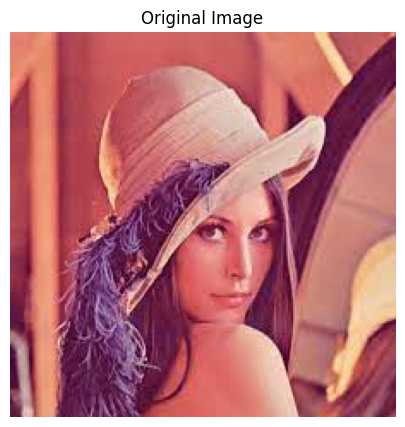

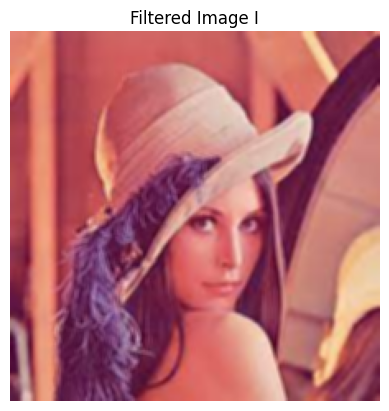

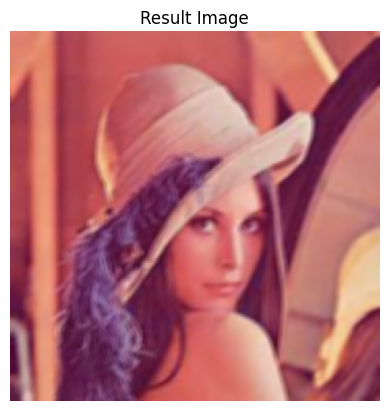

In [43]:
result = cv2.filter2D(image_rgb, -1, equivalent_kernel)

plt.figure(figsize=(10, 5))

plt.imshow(image_rgb, cmap='gray')
plt.title('Original Image')
plt.axis('off')
plt.show()

plt.imshow(filtered_I, cmap='gray')
plt.title('Filtered Image I')
plt.axis('off')
plt.show()
plt.imshow(result, cmap='gray')
plt.title('Result Image')
plt.axis('off')

plt.show()

> ### Q3-partC

In [44]:
psnr_1_2 = cv2.PSNR(filtered_I, filtered_II)
psnr_1_3 = cv2.PSNR(filtered_I, filtered_III)


print("(I), (I) pair PSNR:", psnr_1_2)
print("(I), (III) pair PSNR:", psnr_1_3)

if psnr_1_2 > psnr_1_3:
    print("(I), (I) pair has higher PSNR")
else:
    print("(I), (III) pair has higher PSNR")

(I), (I) pair PSNR: 25.835565135296086
(I), (III) pair PSNR: 42.864314090955986
(I), (III) pair has higher PSNR


As PSNR between (III, I) is higher than between (II, I), the quality of image (III) after undergoing the filtering process is much closer to image (I) compared to image (II).
A higher PSNR value says the distortion introduced by the filtering process is lower, signifying that the filtered image (III) retains more details and closely resembles image (I) compared to the filtered image (II).

> ### Q4

In [63]:
image = plt.imread('/kaggle/input/hw1-cv/Image4.jpeg')


In [64]:
def histogram_equalization(image):
    histogram, bins = np.histogram(image.flatten(), bins=256, range=(0,256))
    cdf = histogram.cumsum()
    cdf_normalized = cdf / cdf.max()
    equalized_image = np.interp(image.flatten(), bins[:-1], cdf_normalized)
    
    return equalized_image.reshape(image.shape)

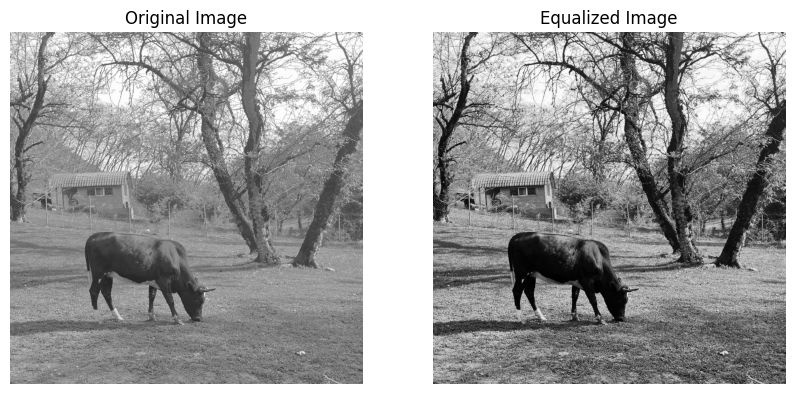

In [65]:
if len(image.shape) > 2:
    image = np.mean(image, axis=2)

equalized_image = histogram_equalization(image)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(equalized_image, cmap='gray')
plt.title('Equalized Image')
plt.axis('off')

plt.show()


In [66]:
gray_image_np = np.array(image)

gray_image_uint8 = gray_image_np.astype(np.uint8)

equalized_image_opencv = cv2.equalizeHist(gray_image_uint8)

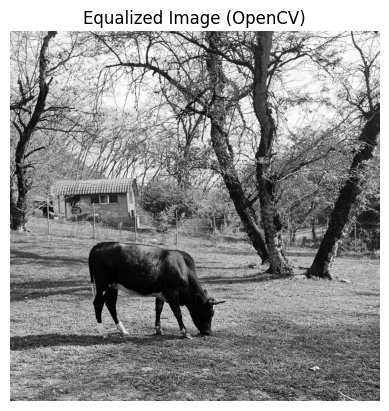

In [67]:
plt.imshow(equalized_image_opencv, cmap='gray')
plt.title('Equalized Image (OpenCV)')
plt.axis('off')
plt.show()


In [68]:
np.array_equal(equalized_image, equalized_image_opencv)

False

In [69]:
equalized_image_float32 = equalized_image.astype(np.float32)
equalized_image_opencv_float32 = equalized_image_opencv.astype(np.float32)

psnr_value = cv2.PSNR(equalized_image_float32, equalized_image_opencv_float32)
psnr_value

4.757404885094623

**So the value of 4.72 shows that the difference between these two equalized images is quite small and may not be noticeable to the naked eye.**

> ### Q5

In [70]:
image = cv2.imread('/kaggle/input/hw1-cv/Image5.jpg')

Text(0.5, 1.0, 'Original Image')

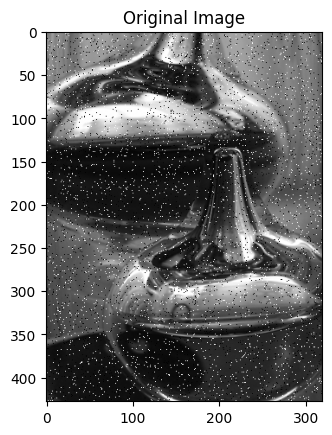

In [71]:
plt.imshow(image)
plt.title('Original Image')

In [72]:
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
equalized_image = cv2.equalizeHist(gray_image)


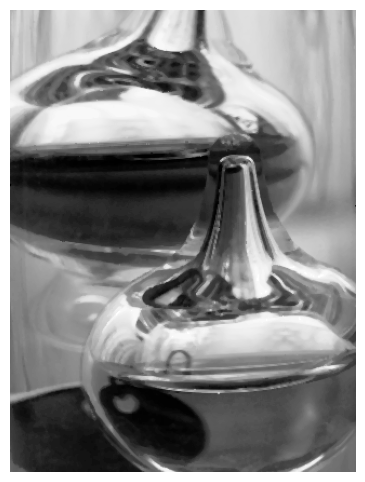

In [73]:
img = cv2.medianBlur(equalized_image, 3)

plt.figure(figsize=(18, 6))
plt.imshow(img, cmap='gray')
plt.axis('off')
plt.show()

> ### Q6

In [74]:
original_image = cv2.imread('/kaggle/input/hw1-cv/Meyman.png')
original_image = cv2.medianBlur(original_image, 5)

<function matplotlib.pyplot.show(close=None, block=None)>

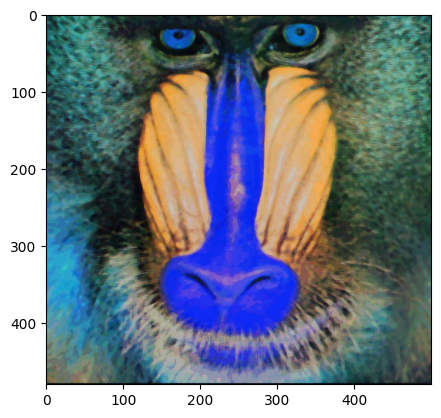

In [75]:
plt.imshow(original_image)
plt.show

In [76]:
blurred_image = cv2.GaussianBlur(original_image, (5, 5), 0)

In [77]:
mean = 0
variance = 0.1
sigma = np.sqrt(variance)
gaussian_noise = np.random.normal(mean, sigma, blurred_image.shape)
noisy_blurred_image = blurred_image + gaussian_noise

noisy_blurred_image = np.clip(noisy_blurred_image, 0, 255)

noisy_blurred_image = np.uint8(noisy_blurred_image)

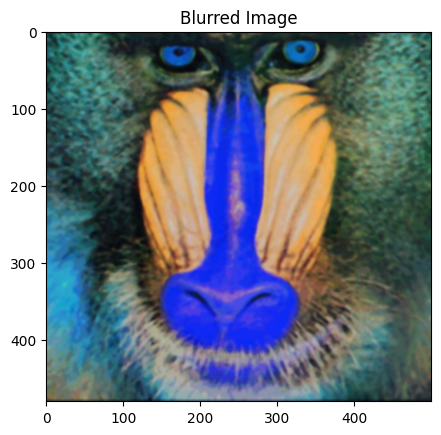

In [78]:
plt.imshow(blurred_image, cmap='gray')
plt.title('Blurred Image')
plt.show()

In [79]:
def enhance_image(original_image, blur_kernel_size=(5, 5), sharpening_coefficient=1.5):
    blurred_image = cv2.GaussianBlur(original_image, (5, 5), 0)
    mean = 0
    variance = 0.1
    sigma = np.sqrt(variance)
    gaussian_noise = np.random.normal(mean, sigma, blurred_image.shape)
    noisy_blurred_image = blurred_image + gaussian_noise
    noisy_blurred_image = np.clip(noisy_blurred_image, 0, 255)
    noisy_blurred_image = np.uint8(noisy_blurred_image)
    difference_image = cv2.subtract(noisy_blurred_image, original_image)
    
    adjusted_difference = sharpening_coefficient * difference_image
    
    adjusted_difference = adjusted_difference.astype(np.uint8)

    enhanced_image = cv2.subtract(original_image, adjusted_difference)
 
    return blurred_image, enhanced_image


blurred_image, enhanced_image = enhance_image(original_image)

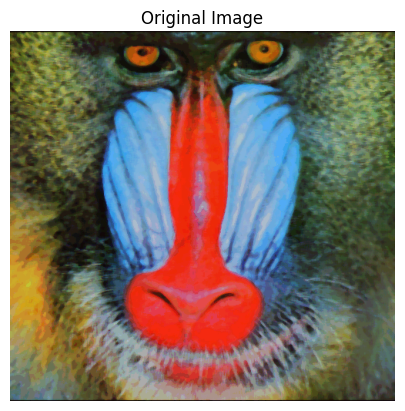

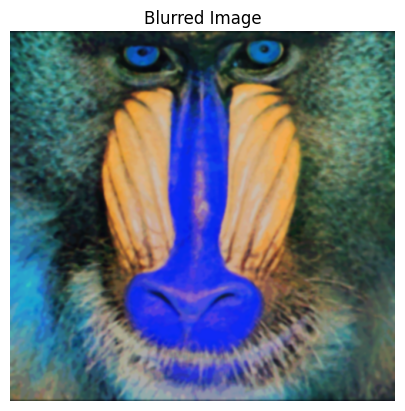

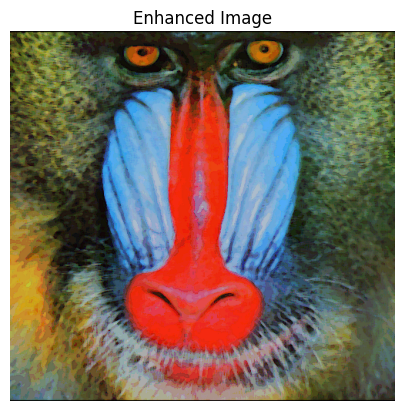

In [84]:
cv2.imwrite('Q6_image_original.png', original_image)
cv2.imwrite('blurred_image.png', blurred_image)
cv2.imwrite('Q6_image_modified.png', enhanced_image)


original_image = cv2.imread('original_image.png')
blurred_image = cv2.imread('blurred_image.png')
enhanced_image = cv2.imread('enhanced_image.png')

original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)
blurred_image = cv2.cvtColor(blurred_image, cv2.COLOR_BGR2RGB)
enhanced_image = cv2.cvtColor(enhanced_image, cv2.COLOR_BGR2RGB)


plt.imshow(original_image)
plt.title('Original Image')
plt.axis('off')
plt.show()

plt.imshow(blurred_image)
plt.title('Blurred Image')
plt.axis('off')
plt.show()

plt.imshow(enhanced_image)
plt.title('Enhanced Image')
plt.axis('off')

plt.show()

**As you can see it got better as the moustache of monkey is sharper in the inhanced image**

> ### Q7

In [81]:
with open("/kaggle/input/hw1-cv/input1.txt", 'r') as file:
    height, width, label = map(int, file.readline().strip().split())

    pixels = [
        [int(val.replace('(', '').replace(')', '').replace(',', ''))
            for val in line.strip().split()]
        for line in file.readlines()
    ]

image_array = np.array(pixels, dtype=np.uint8)


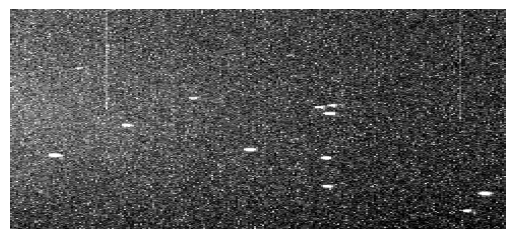

In [82]:
plt.imshow(image_array, cmap='gray')
plt.axis('off')
plt.show()

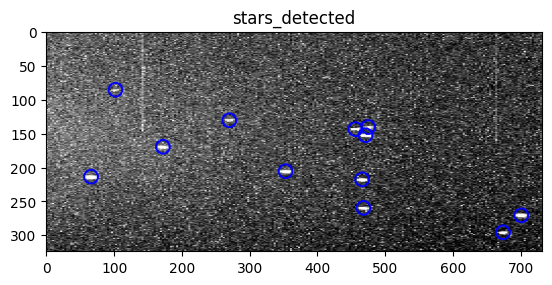

In [83]:
import cv2
import numpy as np

def detect_stars(image, threshold=200):
    _, binary_image = cv2.threshold(image, threshold, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    star_coordinates = []
    for contour in contours:
        area = cv2.contourArea(contour)
        if area > 10:
            M = cv2.moments(contour)
            centroid_x = int(M['m10'] / M['m00'])
            centroid_y = int(M['m01'] / M['m00'])
            star_coordinates.append((centroid_x, centroid_y))
    return star_coordinates

star_coordinates = detect_stars(image_array)

output_image = cv2.cvtColor(image_array, cv2.COLOR_GRAY2BGR)
for (x, y) in star_coordinates:
    cv2.circle(output_image, (x, y), 10, (0, 0, 255), 2)  # Draw a red circle with an empty center

cv2.imwrite('stars_detected.png', output_image)
stars_detected = cv2.imread('stars_detected.png')

plt.imshow(stars_detected)
plt.title('stars_detected')  
plt.show()
